In [1]:
import os
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('data.csv')

In [3]:

df.head(15)

,R_fighter,B_fighter,Referee,date,location,Winner,title_bout,weight_class,no_of_rounds,B_current_lose_streak,...,R_win_by_KO/TKO,R_win_by_Submission,R_win_by_TKO_Doctor_Stoppage,R_wins,R_Stance,R_Height_cms,R_Reach_cms,R_Weight_lbs,B_age,R_age
0,Henry Cejudo,Marlon Moraes,Marc Goddard,2019-06-08,"Chicago, Illinois, USA",Red,True,Bantamweight,5,0.0,...,2.0,0.0,0.0,8.0,Orthodox,162.56,162.56,135.0,31.0,32.0
1,Valentina Shevchenko,Jessica Eye,Robert Madrigal,2019-06-08,"Chicago, Illinois, USA",Red,True,Women's Flyweight,5,0.0,...,0.0,2.0,0.0,5.0,Southpaw,165.10,167.64,125.0,32.0,31.0
2,Tony Ferguson,Donald Cerrone,Dan Miragliotta,2019-06-08,"Chicago, Illinois, USA",Red,False,Lightweight,3,0.0,...,3.0,6.0,1.0,14.0,Orthodox,180.34,193.04,155.0,36.0,35.0
3,Jimmie Rivera,Petr Yan,Kevin MacDonald,2019-06-08,"Chicago, Illinois, USA",Blue,False,Bantamweight,3,0.0,...,1.0,0.0,0.0,6.0,Orthodox,162.56,172.72,135.0,26.0,29.0
4,Tai Tuivasa,Blagoy Ivanov,Dan Miragliotta,2019-06-08,"Chicago, Illinois, USA",Blue,False,Heavyweight,3,0.0,...,2.0,0.0,0.0,3.0,Southpaw,187.96,190.50,264.0,32.0,26.0
5,Tatiana Suarez,Nina Ansaroff,Robert Madrigal,2019-06-08,"Chicago, Illinois, USA",Red,False,Women's Strawweight,3,0.0,...,1.0,2.0,0.0,4.0,NaN,165.10,167.64,115.0,33.0,28.0
6,Aljamain Sterling,Pedro Munhoz,Marc Goddard,2019-06-08,"Chicago, Illinois, USA",Red,False,Bantamweight,3,0.0,...,1.0,3.0,0.0,9.0,Orthodox,170.18,180.34,135.0,32.0,29.0
7,Karolina Kowalkiewicz,Alexa Grasso,Kevin MacDonald,2019-06-08,"Chicago, Illinois, USA",Blue,False,Women's Strawweight,3,1.0,...,0.0,0.0,0.0,5.0,Orthodox,160.02,162.56,115.0,25.0,33.0
8,Ricardo Lamas,Calvin Kattar,Dan Miragliotta,2019-06-08,"Chicago, Illinois, USA",Blue,False,Featherweight,3,0.0,...,4.0,3.0,0.0,10.0,Orthodox,172.72,180.34,145.0,31.0,37.0
9,Yan Xiaonan,Angela Hill,Robert Madrigal,2019-06-08,"Chicago, Illinois, USA",Red,False,Women's Strawweight,3,0.0,...,0.0,0.0,0.0,3.0,Orthodox,165.10,160.02,115.0,34.0,29.0


In [4]:
df.shape

(5144, 145)

In [5]:
R_fighter_names = list(df.R_fighter.unique())
B_fighter_names = list(df.B_fighter.unique())

In [6]:
print(len(R_fighter_names))
print(len(B_fighter_names))

1334
1774


In [7]:
fighter_names = R_fighter_names + B_fighter_names
fighter_names = list(set(fighter_names))
len(fighter_names)

1915

In [8]:
column_names = list(df.columns)

In [9]:
null_values = df.isnull().sum()
pd.set_option('display.max_rows', null_values.shape[0]+1)

null_values

R_fighter                          0
B_fighter                          0
Referee                           23
date                               0
location                           0
Winner                             0
title_bout                         0
weight_class                       0
no_of_rounds                       0
B_current_lose_streak              0
B_current_win_streak               0
B_draw                             0
B_avg_BODY_att                  1265
B_avg_BODY_landed               1265
B_avg_CLINCH_att                1265
B_avg_CLINCH_landed             1265
B_avg_DISTANCE_att              1265
B_avg_DISTANCE_landed           1265
B_avg_GROUND_att                1265
B_avg_GROUND_landed             1265
B_avg_HEAD_att                  1265
B_avg_HEAD_landed               1265
B_avg_KD                        1265
B_avg_LEG_att                   1265
B_avg_LEG_landed                1265
B_avg_PASS                      1265
B_avg_REV                       1265
B

In [10]:
df[['B_Stance', 'R_Stance']] = df[['B_Stance', 'R_Stance']].fillna('Orthodox')
df[['R_Height_cms', 'R_Reach_cms', 'R_age', 'B_age', 'B_Height_cms', 'B_Reach_cms']] = df[['R_Height_cms', 'R_Reach_cms', 'R_age', 'B_age', 'B_Height_cms', 'B_Reach_cms']].fillna(df[['R_Height_cms', 'R_Reach_cms', 'R_age', 'B_age', 'B_Height_cms', 'B_Reach_cms']].mean())

In [11]:
null_values = df.isnull().sum()
pd.set_option('display.max_rows', null_values.shape[0]+1)

null_values

R_fighter                          0
B_fighter                          0
Referee                           23
date                               0
location                           0
Winner                             0
title_bout                         0
weight_class                       0
no_of_rounds                       0
B_current_lose_streak              0
B_current_win_streak               0
B_draw                             0
B_avg_BODY_att                  1265
B_avg_BODY_landed               1265
B_avg_CLINCH_att                1265
B_avg_CLINCH_landed             1265
B_avg_DISTANCE_att              1265
B_avg_DISTANCE_landed           1265
B_avg_GROUND_att                1265
B_avg_GROUND_landed             1265
B_avg_HEAD_att                  1265
B_avg_HEAD_landed               1265
B_avg_KD                        1265
B_avg_LEG_att                   1265
B_avg_LEG_landed                1265
B_avg_PASS                      1265
B_avg_REV                       1265
B

In [12]:
described_df = df.describe().T

In [13]:
pd.set_option('display.max_rows', described_df.shape[0]+1)
print(described_df)

                               count        mean         std    min  \
no_of_rounds                  5144.0    3.119362    0.631457    1.0   
B_current_lose_streak         5144.0    0.429821    0.731325    0.0   
B_current_win_streak          5144.0    0.837286    1.306203    0.0   
B_draw                        5144.0    0.000000    0.000000    0.0   
B_avg_BODY_att                3879.0    8.689387    7.087703    0.0   
B_avg_BODY_landed             3879.0    6.083457    5.074464    0.0   
B_avg_CLINCH_att              3879.0    8.240461    7.575422    0.0   
B_avg_CLINCH_landed           3879.0    5.556352    5.429531    0.0   
B_avg_DISTANCE_att            3879.0   53.156807   41.252426    0.0   
B_avg_DISTANCE_landed         3879.0   19.329445   15.961112    0.0   
B_avg_GROUND_att              3879.0    8.753818    8.756889    0.0   
B_avg_GROUND_landed           3879.0    5.772840    5.733290    0.0   
B_avg_HEAD_att                3879.0   55.453012   36.335929    0.0   
B_avg_

In [14]:
df.info(object)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5144 entries, 0 to 5143
Data columns (total 145 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   R_fighter                     object 
 1   B_fighter                     object 
 2   Referee                       object 
 3   date                          object 
 4   location                      object 
 5   Winner                        object 
 6   title_bout                    bool   
 7   weight_class                  object 
 8   no_of_rounds                  int64  
 9   B_current_lose_streak         float64
 10  B_current_win_streak          float64
 11  B_draw                        float64
 12  B_avg_BODY_att                float64
 13  B_avg_BODY_landed             float64
 14  B_avg_CLINCH_att              float64
 15  B_avg_CLINCH_landed           float64
 16  B_avg_DISTANCE_att            float64
 17  B_avg_DISTANCE_landed         float64
 18  B_avg_GROUND_att           

In [15]:
# Columns offer nothing to our model we want to make.
df.drop(['Referee', 'location', 'weight_class'], axis=1, inplace=True)

In [16]:
df['date'] = pd.to_datetime(df['date'])

In [17]:
df['B_Stance'].unique()

array(['Orthodox', 'Switch', 'Southpaw', 'Open Stance', 'Sideways'],
      dtype=object)

In [18]:
stance_numbered = {"Orthodox":0,
"Southpaw":1,
'Switch':2,
'Open Stance':3,
'Sideways':4
}

In [19]:
df['R_stance'] = np.nan
df['B_stance'] = np.nan

In [20]:
df["R_stance"] = df["R_Stance"].apply(lambda x: stance_numbered.get(x))
df["B_stance"] = df["B_Stance"].apply(lambda x: stance_numbered.get(x))

In [21]:
df.drop(['R_Stance', 'B_Stance'], axis=1, inplace=True)

In [22]:
#Unified Rules of Mixed Martial Arts was made april of 2001 which means fights before the dropped date were no holds barred fights
df = df[df['date'] > '2001-04-01']

In [23]:
df = df.dropna()
df = df.reset_index(drop=True)

In [24]:
null_values = df.isnull().sum()
pd.set_option('display.max_rows', null_values.shape[0]+1)

null_values

R_fighter                       0
B_fighter                       0
date                            0
Winner                          0
title_bout                      0
no_of_rounds                    0
B_current_lose_streak           0
B_current_win_streak            0
B_draw                          0
B_avg_BODY_att                  0
B_avg_BODY_landed               0
B_avg_CLINCH_att                0
B_avg_CLINCH_landed             0
B_avg_DISTANCE_att              0
B_avg_DISTANCE_landed           0
B_avg_GROUND_att                0
B_avg_GROUND_landed             0
B_avg_HEAD_att                  0
B_avg_HEAD_landed               0
B_avg_KD                        0
B_avg_LEG_att                   0
B_avg_LEG_landed                0
B_avg_PASS                      0
B_avg_REV                       0
B_avg_SIG_STR_att               0
B_avg_SIG_STR_landed            0
B_avg_SIG_STR_pct               0
B_avg_SUB_ATT                   0
B_avg_TD_att                    0
B_avg_TD_lande

In [25]:
df.shape

(3549, 142)

In [26]:
df.info(object)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3549 entries, 0 to 3548
Data columns (total 142 columns):
 #   Column                        Dtype         
---  ------                        -----         
 0   R_fighter                     object        
 1   B_fighter                     object        
 2   date                          datetime64[ns]
 3   Winner                        object        
 4   title_bout                    bool          
 5   no_of_rounds                  int64         
 6   B_current_lose_streak         float64       
 7   B_current_win_streak          float64       
 8   B_draw                        float64       
 9   B_avg_BODY_att                float64       
 10  B_avg_BODY_landed             float64       
 11  B_avg_CLINCH_att              float64       
 12  B_avg_CLINCH_landed           float64       
 13  B_avg_DISTANCE_att            float64       
 14  B_avg_DISTANCE_landed         float64       
 15  B_avg_GROUND_att              float64

In [27]:
df.R_fighter.value_counts()

Jim Miller           20
Michael Bisping      20
Demian Maia          19
Donald Cerrone       19
Anderson Silva       19
                     ..
Houston Alexander     1
Marcus Brimage        1
David Michaud         1
Shane Nelson          1
Paul Daley            1
Name: R_fighter, Length: 965, dtype: int64

In [28]:
pd.set_option('display.max_columns', None)
df.head()

,R_fighter,B_fighter,date,Winner,title_bout,no_of_rounds,B_current_lose_streak,B_current_win_streak,B_draw,B_avg_BODY_att,B_avg_BODY_landed,B_avg_CLINCH_att,B_avg_CLINCH_landed,B_avg_DISTANCE_att,B_avg_DISTANCE_landed,B_avg_GROUND_att,B_avg_GROUND_landed,B_avg_HEAD_att,B_avg_HEAD_landed,B_avg_KD,B_avg_LEG_att,B_avg_LEG_landed,B_avg_PASS,B_avg_REV,B_avg_SIG_STR_att,B_avg_SIG_STR_landed,B_avg_SIG_STR_pct,B_avg_SUB_ATT,B_avg_TD_att,B_avg_TD_landed,B_avg_TD_pct,B_avg_TOTAL_STR_att,B_avg_TOTAL_STR_landed,B_longest_win_streak,B_losses,B_avg_opp_BODY_att,B_avg_opp_BODY_landed,B_avg_opp_CLINCH_att,B_avg_opp_CLINCH_landed,B_avg_opp_DISTANCE_att,B_avg_opp_DISTANCE_landed,B_avg_opp_GROUND_att,B_avg_opp_GROUND_landed,B_avg_opp_HEAD_att,B_avg_opp_HEAD_landed,B_avg_opp_KD,B_avg_opp_LEG_att,B_avg_opp_LEG_landed,B_avg_opp_PASS,B_avg_opp_REV,B_avg_opp_SIG_STR_att,B_avg_opp_SIG_STR_landed,B_avg_opp_SIG_STR_pct,B_avg_opp_SUB_ATT,B_avg_opp_TD_att,B_avg_opp_TD_landed,B_avg_opp_TD_pct,B_avg_opp_TOTAL_STR_att,B_avg_opp_TOTAL_STR_landed,B_total_rounds_fought,B_total_time_fought(seconds),B_total_title_bouts,B_win_by_Decision_Majority,B_win_by_Decision_Split,B_win_by_Decision_Unanimous,B_win_by_KO/TKO,B_win_by_Submission,B_win_by_TKO_Doctor_Stoppage,B_wins,B_Height_cms,B_Reach_cms,B_Weight_lbs,R_current_lose_streak,R_current_win_streak,R_draw,R_avg_BODY_att,R_avg_BODY_landed,R_avg_CLINCH_att,R_avg_CLINCH_landed,R_avg_DISTANCE_att,R_avg_DISTANCE_landed,R_avg_GROUND_att,R_avg_GROUND_landed,R_avg_HEAD_att,R_avg_HEAD_landed,R_avg_KD,R_avg_LEG_att,R_avg_LEG_landed,R_avg_PASS,R_avg_REV,R_avg_SIG_STR_att,R_avg_SIG_STR_landed,R_avg_SIG_STR_pct,R_avg_SUB_ATT,R_avg_TD_att,R_avg_TD_landed,R_avg_TD_pct,R_avg_TOTAL_STR_att,R_avg_TOTAL_STR_landed,R_longest_win_streak,R_losses,R_avg_opp_BODY_att,R_avg_opp_BODY_landed,R_avg_opp_CLINCH_att,R_avg_opp_CLINCH_landed,R_avg_opp_DISTANCE_att,R_avg_opp_DISTANCE_landed,R_avg_opp_GROUND_att,R_avg_opp_GROUND_landed,R_avg_opp_HEAD_att,R_avg_opp_HEAD_landed,R_avg_opp_KD,R_avg_opp_LEG_att,R_avg_opp_LEG_landed,R_avg_opp_PASS,R_avg_opp_REV,R_avg_opp_SIG_STR_att,R_avg_opp_SIG_STR_landed,R_avg_opp_SIG_STR_pct,R_avg_opp_SUB_ATT,R_avg_opp_TD_att,R_avg_opp_TD_landed,R_avg_opp_TD_pct,R_avg_opp_TOTAL_STR_att,R_avg_opp_TOTAL_STR_landed,R_total_rounds_fought,R_total_time_fought(seconds),R_total_title_bouts,R_win_by_Decision_Majority,R_win_by_Decision_Split,R_win_by_Decision_Unanimous,R_win_by_KO/TKO,R_win_by_Submission,R_win_by_TKO_Doctor_Stoppage,R_wins,R_Height_cms,R_Reach_cms,R_Weight_lbs,B_age,R_age,R_stance,B_stance
0,Henry Cejudo,Marlon Moraes,2019-06-08,Red,True,5,0.0,4.0,0.0,9.200000,6.000000,0.200000,0.000000,62.600000,20.600000,2.600000,2.000000,48.600000,11.200000,0.800000,7.6,5.400000,0.400000,0.000000,65.40,22.600000,0.466000,0.400000,0.80000,0.200000,0.100000,66.400000,23.600000,4.0,1.0,6.400000,4.000000,1.000000,0.60000,51.200000,17.400000,0.600000,0.200000,39.600000,9.400000,0.200000,6.80000,4.800000,0.000000,0.000000,52.800000,18.20000,0.236000,0.000000,1.000000,0.400000,0.100000,53.800000,19.200000,9.0,419.400000,0.0,0.0,1.0,0.0,2.0,1.0,0.0,4.0,167.64,170.18,135.0,0.0,4.0,0.0,21.900000,16.400000,17.000000,11.000000,75.000000,26.500000,9.400000,6.500000,74.200000,23.90,0.400,5.300000,3.700000,1.200000,0.000000,101.400000,44.000000,0.466000,0.100000,5.300000,1.900000,0.458000,129.900000,69.100000,4.0,2.0,13.300000,8.800000,7.500000,5.100000,90.500000,26.800000,0.800000,0.300000,76.100000,17.300000,0.100000,9.400000,6.100000,0.000000,0.000000,98.800000,32.200000,0.336000,0.000000,0.900000,0.100000,0.050000,110.500000,43.300000,27.0,742.60,3.0,0.0,2.0,4.0,2.0,0.0,0.0,8.0,162.56,162.56,135.0,31.0,32.0,0,0
1,Valentina Shevchenko,Jessica Eye,2019-06-08,Red,True,5,0.0,3.0,0.0,14.600000,9.100000,11.800000,7.300000,124.700000,42.100000,2.400000,1.900000,112.000000,32.000000,0.000000,12.3,10.200000,0.800000,0.000000,138.90,51.300000,0.399000,0.700000,1.00000,0.500000,0.225000,158.700000,69.600000,3.0,6.0,13.000000,9.300000,12.800000,9.

In [29]:
print(column_names)

['R_fighter', 'B_fighter', 'Referee', 'date', 'location', 'Winner', 'title_bout', 'weight_class', 'no_of_rounds', 'B_current_lose_streak', 'B_current_win_streak', 'B_draw', 'B_avg_BODY_att', 'B_avg_BODY_landed', 'B_avg_CLINCH_att', 'B_avg_CLINCH_landed', 'B_avg_DISTANCE_att', 'B_avg_DISTANCE_landed', 'B_avg_GROUND_att', 'B_avg_GROUND_landed', 'B_avg_HEAD_att', 'B_avg_HEAD_landed', 'B_avg_KD', 'B_avg_LEG_att', 'B_avg_LEG_landed', 'B_avg_PASS', 'B_avg_REV', 'B_avg_SIG_STR_att', 'B_avg_SIG_STR_landed', 'B_avg_SIG_STR_pct', 'B_avg_SUB_ATT', 'B_avg_TD_att', 'B_avg_TD_landed', 'B_avg_TD_pct', 'B_avg_TOTAL_STR_att', 'B_avg_TOTAL_STR_landed', 'B_longest_win_streak', 'B_losses', 'B_avg_opp_BODY_att', 'B_avg_opp_BODY_landed', 'B_avg_opp_CLINCH_att', 'B_avg_opp_CLINCH_landed', 'B_avg_opp_DISTANCE_att', 'B_avg_opp_DISTANCE_landed', 'B_avg_opp_GROUND_att', 'B_avg_opp_GROUND_landed', 'B_avg_opp_HEAD_att', 'B_avg_opp_HEAD_landed', 'B_avg_opp_KD', 'B_avg_opp_LEG_att', 'B_avg_opp_LEG_landed', 'B_avg_op

In [30]:
b_fighter_cols = ['B_avg_BODY_att', 'B_avg_BODY_landed', 'B_avg_CLINCH_att', 
'B_avg_CLINCH_landed', 'B_avg_DISTANCE_att', 'B_avg_DISTANCE_landed', 
'B_avg_GROUND_att', 'B_avg_GROUND_landed', 'B_avg_HEAD_att', 'B_avg_HEAD_landed', 
'B_avg_KD', 'B_avg_LEG_att', 'B_avg_LEG_landed', 'B_avg_PASS', 'B_avg_REV', 
'B_avg_SIG_STR_att', 'B_avg_SIG_STR_landed', 'B_avg_SIG_STR_pct', 'B_avg_SUB_ATT', 
'B_avg_TD_att', 'B_avg_TD_landed', 'B_avg_TD_pct', 'B_avg_TOTAL_STR_att', 
'B_avg_TOTAL_STR_landed', 'B_longest_win_streak', 'B_losses', 'B_avg_opp_BODY_att', 
'B_avg_opp_BODY_landed', 'B_avg_opp_CLINCH_att', 'B_avg_opp_CLINCH_landed', 
'B_avg_opp_DISTANCE_att', 'B_avg_opp_DISTANCE_landed', 'B_avg_opp_GROUND_att', 
'B_avg_opp_GROUND_landed', 'B_avg_opp_HEAD_att', 'B_avg_opp_HEAD_landed', 
'B_avg_opp_KD', 'B_avg_opp_LEG_att', 'B_avg_opp_LEG_landed', 'B_avg_opp_PASS', 
'B_avg_opp_REV', 'B_avg_opp_SIG_STR_att', 'B_avg_opp_SIG_STR_landed', 
'B_avg_opp_SIG_STR_pct', 'B_avg_opp_SUB_ATT', 'B_avg_opp_TD_att', 'B_avg_opp_TD_landed', 
'B_avg_opp_TD_pct', 'B_avg_opp_TOTAL_STR_att', 'B_avg_opp_TOTAL_STR_landed', 
'B_total_rounds_fought', 'B_total_time_fought(seconds)']


In [31]:
b_fighter_dict = {}
for name in fighter_names:
        b_fighter_dict[name] = df.loc[df['B_fighter'] == name, ['B_avg_BODY_att', 'B_avg_BODY_landed', 'B_avg_CLINCH_att', 
'B_avg_CLINCH_landed', 'B_avg_DISTANCE_att', 'B_avg_DISTANCE_landed', 
'B_avg_GROUND_att', 'B_avg_GROUND_landed', 'B_avg_HEAD_att', 'B_avg_HEAD_landed', 
'B_avg_KD', 'B_avg_LEG_att', 'B_avg_LEG_landed', 'B_avg_PASS', 'B_avg_REV', 
'B_avg_SIG_STR_att', 'B_avg_SIG_STR_landed', 'B_avg_SIG_STR_pct', 'B_avg_SUB_ATT', 
'B_avg_TD_att', 'B_avg_TD_landed', 'B_avg_TD_pct', 'B_avg_TOTAL_STR_att', 
'B_avg_TOTAL_STR_landed', 'B_longest_win_streak', 'B_losses', 'B_avg_opp_BODY_att', 
'B_avg_opp_BODY_landed', 'B_avg_opp_CLINCH_att', 'B_avg_opp_CLINCH_landed', 
'B_avg_opp_DISTANCE_att', 'B_avg_opp_DISTANCE_landed', 'B_avg_opp_GROUND_att', 
'B_avg_opp_GROUND_landed', 'B_avg_opp_HEAD_att', 'B_avg_opp_HEAD_landed', 
'B_avg_opp_KD', 'B_avg_opp_LEG_att', 'B_avg_opp_LEG_landed', 'B_avg_opp_PASS', 
'B_avg_opp_REV', 'B_avg_opp_SIG_STR_att', 'B_avg_opp_SIG_STR_landed', 
'B_avg_opp_SIG_STR_pct', 'B_avg_opp_SUB_ATT', 'B_avg_opp_TD_att', 'B_avg_opp_TD_landed', 
'B_avg_opp_TD_pct', 'B_avg_opp_TOTAL_STR_att', 'B_avg_opp_TOTAL_STR_landed', 
'B_total_rounds_fought', 'B_total_time_fought(seconds)']].mean()


In [32]:
b_fighter_stats = pd.DataFrame.from_dict(b_fighter_dict, orient='index', columns=b_fighter_cols)
b_fighter_stats.head()

,B_avg_BODY_att,B_avg_BODY_landed,B_avg_CLINCH_att,B_avg_CLINCH_landed,B_avg_DISTANCE_att,B_avg_DISTANCE_landed,B_avg_GROUND_att,B_avg_GROUND_landed,B_avg_HEAD_att,B_avg_HEAD_landed,B_avg_KD,B_avg_LEG_att,B_avg_LEG_landed,B_avg_PASS,B_avg_REV,B_avg_SIG_STR_att,B_avg_SIG_STR_landed,B_avg_SIG_STR_pct,B_avg_SUB_ATT,B_avg_TD_att,B_avg_TD_landed,B_avg_TD_pct,B_avg_TOTAL_STR_att,B_avg_TOTAL_STR_landed,B_longest_win_streak,B_losses,B_avg_opp_BODY_att,B_avg_opp_BODY_landed,B_avg_opp_CLINCH_att,B_avg_opp_CLINCH_landed,B_avg_opp_DISTANCE_att,B_avg_opp_DISTANCE_landed,B_avg_opp_GROUND_att,B_avg_opp_GROUND_landed,B_avg_opp_HEAD_att,B_avg_opp_HEAD_landed,B_avg_opp_KD,B_avg_opp_LEG_att,B_avg_opp_LEG_landed,B_avg_opp_PASS,B_avg_opp_REV,B_avg_opp_SIG_STR_att,B_avg_opp_SIG_STR_landed,B_avg_opp_SIG_STR_pct,B_avg_opp_SUB_ATT,B_avg_opp_TD_att,B_avg_opp_TD_landed,B_avg_opp_TD_pct,B_avg_opp_TOTAL_STR_att,B_avg_opp_TOTAL_STR_landed,B_total_rounds_fought,B_total_time_fought(seconds)
Dustin Hazelett,2.424603,1.779101,2.001323,1.374339,24.313492,9.391534,9.997354,4.705026,31.699735,12.260582,0.000000,2.187831,1.431217,0.000000,0.084656,36.312169,15.470899,0.430741,1.591270,0.326720,0.252646,0.252646,44.129630,22.784392,3.0,2.333333,3.542328,2.801587,3.063492,1.978836,20.208995,7.903439,4.906085,3.739418,21.937831,8.896825,0.15873,2.698413,1.923280,1.465608,0.000000,28.178571,13.621693,0.448360,0.167989,1.960317,1.288360,0.626323,40.198413,25.399471,10.333333,353.900794
Ray Borg,5.880952,4.757143,4.233333,2.607937,14.088889,3.566667,16.114286,11.123810,27.630159,12.003175,0.000000,0.925397,0.538095,6.041270,0.217460,34.436508,17.298413,0.536063,1.801587,5.526984,2.960317,0.657921,60.061905,40.236508,3.0,2.000000,11.511111,8.126984,8.163492,6.653968,31.787302,9.563492,6.161905,5.604762,31.965079,11.276190,0.00000,2.636508,2.419048,1.576190,0.509524,46.112698,21.822222,0.369286,0.103175,2.114286,1.019048,0.197016,71.296825,45.260317,16.000000,749.350794
Andy Ogle,12.000000,8.000000,1.000000,0.666667,51.333333,21.333333,13.666667,10.666667,49.333333,20.000000,0.333333,4.666667,4.666667,0.666667,0.333333,66.000000,32.666667,0.486667,0.000000,6.333333,1.666667,0.473333,149.000000,111.000000,1.0,2.000000,7.333333,6.000000,2.666667,2.666667,49.666667,21.000000,0.666667,0.666667,41.666667,15.333333,0.00000,4.000000,3.000000,1.000000,0.666667,53.000000,24.333333,0.420000,1.000000,0.666667,0.333333,0.166667,70.666667,41.666667,9.000000,900.000000
Brock Larson,2.400000,2.000000,7.400000,4.400000,12.800000,3.600000,7.400000,4.800000,22.800000,8.600000,0.000000,2.400000,2.200000,1.200000,0.000000,27.600000,12.800000,0.496000,1.200000,5.400000,1.600000,0.400000,44.800000,28.200000,3.0,2.000000,4.200000,3.200000,6.000000,3.200000,14.600000,3.800000,10.200000,6.800000,22.000000,7.000000,0.00000,4.600000,3.600000,1.000000,0.000000,30.800000,13.800000,0.324000,0.600000,3.800000,2.200000,0.250000,87.000000,69.200000,11.000000,601.400000
Arjan Bhullar,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [33]:
r_fighter_cols =  ['R_avg_BODY_att', 'R_avg_BODY_landed',
       'R_avg_CLINCH_att', 'R_avg_CLINCH_landed', 'R_avg_DISTANCE_att',
       'R_avg_DISTANCE_landed', 'R_avg_GROUND_att', 'R_avg_GROUND_landed',
       'R_avg_HEAD_att', 'R_avg_HEAD_landed', 'R_avg_KD', 'R_avg_LEG_att',
       'R_avg_LEG_landed', 'R_avg_PASS', 'R_avg_REV', 'R_avg_SIG_STR_att',
       'R_avg_SIG_STR_landed', 'R_avg_SIG_STR_pct', 'R_avg_SUB_ATT',
       'R_avg_TD_att', 'R_avg_TD_landed', 'R_avg_TD_pct',
       'R_avg_TOTAL_STR_att', 'R_avg_TOTAL_STR_landed', 'R_longest_win_streak',
       'R_losses', 'R_avg_opp_BODY_att', 'R_avg_opp_BODY_landed',
       'R_avg_opp_CLINCH_att', 'R_avg_opp_CLINCH_landed',
       'R_avg_opp_DISTANCE_att', 'R_avg_opp_DISTANCE_landed',
       'R_avg_opp_GROUND_att', 'R_avg_opp_GROUND_landed', 'R_avg_opp_HEAD_att',
       'R_avg_opp_HEAD_landed', 'R_avg_opp_KD', 'R_avg_opp_LEG_att',
       'R_avg_opp_LEG_landed', 'R_avg_opp_PASS', 'R_avg_opp_REV',
       'R_avg_opp_SIG_STR_att', 'R_avg_opp_SIG_STR_landed',
       'R_avg_opp_SIG_STR_pct', 'R_avg_opp_SUB_ATT', 'R_avg_opp_TD_att',
       'R_avg_opp_TD_landed', 'R_avg_opp_TD_pct', 'R_avg_opp_TOTAL_STR_att',
       'R_avg_opp_TOTAL_STR_landed', 'R_total_rounds_fought',
       'R_total_time_fought(seconds)']


In [34]:
r_fighter_dict = {}
for name in fighter_names:
        r_fighter_dict[name] = df.loc[df['R_fighter'] == name, ['R_avg_BODY_att', 'R_avg_BODY_landed',
       'R_avg_CLINCH_att', 'R_avg_CLINCH_landed', 'R_avg_DISTANCE_att',
       'R_avg_DISTANCE_landed', 'R_avg_GROUND_att', 'R_avg_GROUND_landed',
       'R_avg_HEAD_att', 'R_avg_HEAD_landed', 'R_avg_KD', 'R_avg_LEG_att',
       'R_avg_LEG_landed', 'R_avg_PASS', 'R_avg_REV', 'R_avg_SIG_STR_att',
       'R_avg_SIG_STR_landed', 'R_avg_SIG_STR_pct', 'R_avg_SUB_ATT',
       'R_avg_TD_att', 'R_avg_TD_landed', 'R_avg_TD_pct',
       'R_avg_TOTAL_STR_att', 'R_avg_TOTAL_STR_landed', 'R_longest_win_streak',
       'R_losses', 'R_avg_opp_BODY_att', 'R_avg_opp_BODY_landed',
       'R_avg_opp_CLINCH_att', 'R_avg_opp_CLINCH_landed',
       'R_avg_opp_DISTANCE_att', 'R_avg_opp_DISTANCE_landed',
       'R_avg_opp_GROUND_att', 'R_avg_opp_GROUND_landed', 'R_avg_opp_HEAD_att',
       'R_avg_opp_HEAD_landed', 'R_avg_opp_KD', 'R_avg_opp_LEG_att',
       'R_avg_opp_LEG_landed', 'R_avg_opp_PASS', 'R_avg_opp_REV',
       'R_avg_opp_SIG_STR_att', 'R_avg_opp_SIG_STR_landed',
       'R_avg_opp_SIG_STR_pct', 'R_avg_opp_SUB_ATT', 'R_avg_opp_TD_att',
       'R_avg_opp_TD_landed', 'R_avg_opp_TD_pct', 'R_avg_opp_TOTAL_STR_att',
       'R_avg_opp_TOTAL_STR_landed', 'R_total_rounds_fought',
       'R_total_time_fought(seconds)']].mean()


In [35]:
r_fighter_stats = pd.DataFrame.from_dict(r_fighter_dict, orient='index', columns=r_fighter_cols)

In [36]:
r_fighter_stats.head()

,R_avg_BODY_att,R_avg_BODY_landed,R_avg_CLINCH_att,R_avg_CLINCH_landed,R_avg_DISTANCE_att,R_avg_DISTANCE_landed,R_avg_GROUND_att,R_avg_GROUND_landed,R_avg_HEAD_att,R_avg_HEAD_landed,R_avg_KD,R_avg_LEG_att,R_avg_LEG_landed,R_avg_PASS,R_avg_REV,R_avg_SIG_STR_att,R_avg_SIG_STR_landed,R_avg_SIG_STR_pct,R_avg_SUB_ATT,R_avg_TD_att,R_avg_TD_landed,R_avg_TD_pct,R_avg_TOTAL_STR_att,R_avg_TOTAL_STR_landed,R_longest_win_streak,R_losses,R_avg_opp_BODY_att,R_avg_opp_BODY_landed,R_avg_opp_CLINCH_att,R_avg_opp_CLINCH_landed,R_avg_opp_DISTANCE_att,R_avg_opp_DISTANCE_landed,R_avg_opp_GROUND_att,R_avg_opp_GROUND_landed,R_avg_opp_HEAD_att,R_avg_opp_HEAD_landed,R_avg_opp_KD,R_avg_opp_LEG_att,R_avg_opp_LEG_landed,R_avg_opp_PASS,R_avg_opp_REV,R_avg_opp_SIG_STR_att,R_avg_opp_SIG_STR_landed,R_avg_opp_SIG_STR_pct,R_avg_opp_SUB_ATT,R_avg_opp_TD_att,R_avg_opp_TD_landed,R_avg_opp_TD_pct,R_avg_opp_TOTAL_STR_att,R_avg_opp_TOTAL_STR_landed,R_total_rounds_fought,R_total_time_fought(seconds)
Dustin Hazelett,2.210417,1.712500,2.227083,1.545833,27.120833,10.350000,12.147917,5.722917,36.760417,14.2375,0.000000,2.525000,1.668750,0.000000,0.072917,41.495833,17.618750,0.417875,1.422917,0.279167,0.279167,0.279167,50.889583,26.393750,2.750000,2.000000,2.231250,1.662500,1.416667,0.808333,21.387500,7.850000,3.729167,2.852083,21.695833,8.029167,0.154167,2.606250,1.818750,1.639583,0.000000,26.533333,11.510417,0.465562,0.206250,2.175000,1.35,0.628125,38.316667,23.087500,8.750000,380.975000
Ray Borg,3.375000,2.500000,2.750000,0.875000,8.000000,2.875000,10.625000,7.125000,17.125000,7.8750,0.000000,0.875000,0.500000,4.250000,0.375000,21.375000,10.875000,0.557500,2.250000,4.500000,3.250000,0.836250,39.000000,26.375000,2.000000,1.000000,12.875000,10.875000,10.625000,8.625000,17.625000,4.875000,6.000000,5.125000,19.750000,6.250000,0.000000,1.625000,1.500000,0.625000,0.625000,34.250000,18.625000,0.321250,0.000000,1.625000,0.75,0.187500,64.500000,47.375000,7.000000,598.375000
Andy Ogle,12.500000,7.666667,2.416667,1.583333,62.000000,24.166667,15.666667,13.333333,62.166667,26.0000,0.583333,5.416667,5.416667,0.500000,0.250000,80.083333,39.083333,0.476667,0.000000,7.583333,1.333333,0.371667,145.916667,101.416667,0.666667,1.666667,10.083333,8.833333,4.083333,3.583333,62.750000,27.333333,0.833333,0.750000,53.250000,19.083333,0.000000,4.333333,3.750000,0.666667,0.166667,67.666667,31.666667,0.432500,0.750000,1.166667,0.50,0.155833,80.083333,43.833333,7.000000,888.333333
Brock Larson,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Arjan Bhullar,1.666667,1.055556,7.166667,4.666667,29.944444,12.833333,7.777778,4.888889,42.777778,21.0000,0.611111,0.444444,0.333333,0.888889,0.000000,44.888889,22.388889,0.493333,0.000000,1.666667,1.277778,0.850000,90.888889,59.333333,1.000000,0.666667,11.666667,7.722222,9.333333,4.944444,76.388889,22.444444,1.111111,0.555556,68.277778,13.444444,0.000000,6.888889,6.777778,0.000000,0.000000,86.833333,27.944444,0.358889,0.277778,0.111111,0.00,0.000000,102.944444,43.444444,5.333333,766.388889


In [37]:
#Create 2 different fighter dataframes

In [38]:
winner_b = {'Blue':1, 'Red':0}
winner_r = {'Red':1, 'Blue':0}

In [39]:
#Gonna use Donald Cerrone since one of most vetted fighters has a lot of data on him win and loss
df_cowboy_r = df.loc[df['R_fighter'] == 'Donald Cerrone']
df_cowboy_b = df.loc[df['B_fighter'] == 'Donald Cerrone']

In [40]:
df_cowboy_r["winner"] = df_cowboy_r["Winner"].apply(lambda x: winner_r.get(x))
df_cowboy_b["winner"] = df_cowboy_b["Winner"].apply(lambda x: winner_b.get(x))

/Users/oraff/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/Users/oraff/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [41]:
df_cowboy_b = df_cowboy_b.rename(columns={'R_fighter':'Opponent',
 'B_fighter':'Cowboy','B_current_lose_streak':'c_current_lose_streak',
 'B_current_win_streak':'C_current_win_streak',
 'B_draw':'C_draw',
 'B_avg_BODY_att':'C_avg_BODY_att',
 'B_avg_BODY_landed':'C_avg_BODY_landed',
 'B_avg_CLINCH_att':'C_avg_CLINCH_att',
 'B_avg_CLINCH_landed':'C_avg_CLINCH_landed',
 'B_avg_DISTANCE_att':'C_avg_DISTANCE_att',
 'B_avg_DISTANCE_landed':'C_avg_DISTANCE_landed',
 'B_avg_GROUND_att':'C_avg_GROUND_att',
 'B_avg_GROUND_landed':'C_avg_GROUND_landed',
 'B_avg_HEAD_att':'C_avg_HEAD_att',
 'B_avg_HEAD_landed':'C_avg_HEAD_landed',
 'B_avg_KD':'C_avg_KD',
 'B_avg_LEG_att':'C_avg_LEG_att',
 'B_avg_LEG_landed':'C_avg_LEG_landed',
 'B_avg_PASS':'C_avg_PASS',
 'B_avg_REV':'C_avg_REV',
 'B_avg_SIG_STR_att':'C_avg_SIG_STR_att',
 'B_avg_SIG_STR_landed':'C_avg_SIG_STR_landed',
 'B_avg_SIG_STR_pct':'C_avg_SIG_STR_pct',
 'B_avg_SUB_ATT':'C_avg_SUB_ATT',
 'B_avg_TD_att':'C_avg_TD_att',
 'B_avg_TD_landed':'C_avg_TD_landed',
 'B_avg_TD_pct':'C_avg_TD_pct',
 'B_avg_TOTAL_STR_att':'C_avg_TOTAL_STR_att',
 'B_avg_TOTAL_STR_landed':'C_avg_TOTAL_STR_landed',
 'B_longest_win_streak':'C_longest_win_streak',
 'B_losses':'C_losses',
 'B_avg_opp_BODY_att':'C_avg_opp_BODY_att',
 'B_avg_opp_BODY_landed':'C_avg_opp_BODY_landed',
 'B_avg_opp_CLINCH_att':'C_avg_opp_CLINCH_att',
 'B_avg_opp_CLINCH_landed':'C_avg_opp_CLINCH_landed',
 'B_avg_opp_DISTANCE_att':'C_avg_opp_DISTANCE_att',
 'B_avg_opp_DISTANCE_landed':'C_avg_opp_DISTANCE_landed',
 'B_avg_opp_GROUND_att':'C_avg_opp_GROUND_att',
 'B_avg_opp_GROUND_landed':'C_avg_opp_GROUND_landed',
 'B_avg_opp_HEAD_att':'C_avg_opp_HEAD_att',
 'B_avg_opp_HEAD_landed':'C_avg_opp_HEAD_landed',
 'B_avg_opp_KD':'C_avg_opp_KD',
 'B_avg_opp_LEG_att':'C_avg_opp_LEG_att',
 'B_avg_opp_LEG_landed':'C_avg_opp_LEG_landed',
 'B_avg_opp_PASS':'C_avg_opp_PASS',
 'B_avg_opp_REV':'C_avg_opp_REV',
 'B_avg_opp_SIG_STR_att':'C_avg_opp_SIG_STR_att',
 'B_avg_opp_SIG_STR_landed':'C_avg_opp_SIG_STR_landed',
 'B_avg_opp_SIG_STR_pct':'C_avg_opp_SIG_STR_pct',
 'B_avg_opp_SUB_ATT':'C_avg_opp_SUB_ATT',
 'B_avg_opp_TD_att':'C_avg_opp_TD_att',
 'B_avg_opp_TD_landed':'C_avg_opp_TD_landed',
 'B_avg_opp_TD_pct':'C_avg_opp_TD_pct',
 'B_avg_opp_TOTAL_STR_att':'C_avg_opp_TOTAL_STR_att',
 'B_avg_opp_TOTAL_STR_landed':'C_avg_opp_TOTAL_STR_landed',
 'B_total_rounds_fought':'C_total_rounds_fought',
 'B_total_time_fought(seconds)':'C_total_time_fought(seconds)',
 'B_total_title_bouts':'C_total_title_bouts',
 'B_win_by_Decision_Majority':'C_win_by_Decision_Majority',
 'B_win_by_Decision_Split':'C_win_by_Decision_Split',
 'B_win_by_Decision_Unanimous':'C_win_by_Decision_Unanimous',
 'B_win_by_KO/TKO':'C_win_by_KO/TKO',
 'B_win_by_Submission':'C_win_by_Submission',
 'B_win_by_TKO_Doctor_Stoppage':'C_win_by_TKO_Doctor_Stoppage',
 'B_wins':'C_wins',
 'B_Height_cms':'C_Height_cms',
 'B_Reach_cms':'C_Reach_cms',
 'B_Weight_lbs':'C_Weight_lbs',
 'R_current_lose_streak':'O_current_lose_streak',
 'R_current_win_streak':'O_current_win_streak',
 'R_draw':'O_draw',
 'R_avg_BODY_att':'O_avg_BODY_att',
 'R_avg_BODY_landed':'O_avg_BODY_landed',
 'R_avg_CLINCH_att':'O_avg_CLINCH_att',
 'R_avg_CLINCH_landed':'O_avg_CLINCH_landed',
 'R_avg_DISTANCE_att':'O_avg_DISTANCE_att',
 'R_avg_DISTANCE_landed':'O_avg_DISTANCE_landed',
 'R_avg_GROUND_att':'O_avg_GROUND_att',
 'R_avg_GROUND_landed':'O_avg_GROUND_landed',
 'R_avg_HEAD_att':'O_avg_HEAD_att',
 'R_avg_HEAD_landed':'O_avg_HEAD_landed',
 'R_avg_KD':'O_avg_KD',
 'R_avg_LEG_att':'O_avg_LEG_att',
 'R_avg_LEG_landed':'O_avg_LEG_landed',
 'R_avg_PASS':'O_avg_PASS',
 'R_avg_REV':'O_avg_REV',
 'R_avg_SIG_STR_att':'O_avg_SIG_STR_att',
 'R_avg_SIG_STR_landed':'O_avg_SIG_STR_landed',
 'R_avg_SIG_STR_pct':'O_avg_SIG_STR_pct',
 'R_avg_SUB_ATT':'O_avg_SUB_ATT',
 'R_avg_TD_att':'O_avg_TD_att',
 'R_avg_TD_landed':'O_avg_TD_landed',
 'R_avg_TD_pct':'O_avg_TD_pct',
 'R_avg_TOTAL_STR_att':'O_avg_TOTAL_STR_att',
 'R_avg_TOTAL_STR_landed':'O_avg_TOTAL_STR_landed',
 'R_longest_win_streak':'O_longest_win_streak',
 'R_losses':'O_losses',
 'R_avg_opp_BODY_att':'O_avg_opp_BODY_att',
 'R_avg_opp_BODY_landed':'O_avg_opp_BODY_landed',
 'R_avg_opp_CLINCH_att':'O_avg_opp_CLINCH_att',
 'R_avg_opp_CLINCH_landed':'O_avg_opp_CLINCH_landed',
 'R_avg_opp_DISTANCE_att':'O_avg_opp_DISTANCE_att',
 'R_avg_opp_DISTANCE_landed':'O_avg_opp_DISTANCE_landed',
 'R_avg_opp_GROUND_att':'O_avg_opp_GROUND_att',
 'R_avg_opp_GROUND_landed':'O_avg_opp_GROUND_landed',
 'R_avg_opp_HEAD_att':'O_avg_opp_HEAD_att',
 'R_avg_opp_HEAD_landed':'O_avg_opp_HEAD_landed',
 'R_avg_opp_KD':'O_avg_opp_KD',
 'R_avg_opp_LEG_att':'O_avg_opp_LEG_att',
 'R_avg_opp_LEG_landed':'O_avg_opp_LEG_landed',
 'R_avg_opp_PASS':'O_avg_opp_PASS',
 'R_avg_opp_REV':'O_avg_opp_REV',
 'R_avg_opp_SIG_STR_att':'O_avg_opp_SIG_STR_att',
 'R_avg_opp_SIG_STR_landed':'O_avg_opp_SIG_STR_landed',
 'R_avg_opp_SIG_STR_pct':'O_avg_opp_SIG_STR_pct',
 'R_avg_opp_SUB_ATT':'O_avg_opp_SUB_ATT',
 'R_avg_opp_TD_att':'O_avg_opp_TD_att',
 'R_avg_opp_TD_landed':'O_avg_opp_TD_landed',
 'R_avg_opp_TD_pct':'O_avg_opp_TD_pct',
 'R_avg_opp_TOTAL_STR_att':'O_avg_opp_TOTAL_STR_att',
 'R_avg_opp_TOTAL_STR_landed':'O_avg_opp_TOTAL_STR_landed',
 'R_total_rounds_fought':'O_total_rounds_fought',
 'R_total_time_fought(seconds)':'O_total_time_fought(seconds)',
 'R_total_title_bouts':'O_total_title_bouts',
 'R_win_by_Decision_Majority':'O_win_by_Decision_Majority',
 'R_win_by_Decision_Split':'O_win_by_Decision_Split',
 'R_win_by_Decision_Unanimous':'O_win_by_Decision_Unanimous',
 'R_win_by_KO/TKO':'O_win_by_KO',
 'R_win_by_Submission':'O_win_by_Submission',
 'R_win_by_TKO_Doctor_Stoppage':'O_win_by_TKO_Doctor_Stoppage',
 'R_wins':'O_wins',
 'R_Height_cms':'O_Height_cms',
 'R_Reach_cms':'O_Reach_cms',
 'R_Weight_lbs':'O_Weight_lbs',
 'B_age':'C_age',
 'R_age':'O_age',
 'R_stance':'O_stance',
 'B_stance':'C_stance'})

In [42]:
df_cowboy_r = df_cowboy_r.rename(columns={'R_fighter':'Cowboy',
 'B_fighter':'Opponent','R_current_lose_streak':'c_current_lose_streak',
 'R_current_win_streak':'C_current_win_streak',
 'R_draw':'C_draw',
 'R_avg_BODY_att':'C_avg_BODY_att',
 'R_avg_BODY_landed':'C_avg_BODY_landed',
 'R_avg_CLINCH_att':'C_avg_CLINCH_att',
 'R_avg_CLINCH_landed':'C_avg_CLINCH_landed',
 'R_avg_DISTANCE_att':'C_avg_DISTANCE_att',
 'R_avg_DISTANCE_landed':'C_avg_DISTANCE_landed',
 'R_avg_GROUND_att':'C_avg_GROUND_att',
 'R_avg_GROUND_landed':'C_avg_GROUND_landed',
 'R_avg_HEAD_att':'C_avg_HEAD_att',
 'R_avg_HEAD_landed':'C_avg_HEAD_landed',
 'R_avg_KD':'C_avg_KD',
 'R_avg_LEG_att':'C_avg_LEG_att',
 'R_avg_LEG_landed':'C_avg_LEG_landed',
 'R_avg_PASS':'C_avg_PASS',
 'R_avg_REV':'C_avg_REV',
 'R_avg_SIG_STR_att':'C_avg_SIG_STR_att',
 'R_avg_SIG_STR_landed':'C_avg_SIG_STR_landed',
 'R_avg_SIG_STR_pct':'C_avg_SIG_STR_pct',
 'R_avg_SUB_ATT':'C_avg_SUB_ATT',
 'R_avg_TD_att':'C_avg_TD_att',
 'R_avg_TD_landed':'C_avg_TD_landed',
 'R_avg_TD_pct':'C_avg_TD_pct',
 'R_avg_TOTAL_STR_att':'C_avg_TOTAL_STR_att',
 'R_avg_TOTAL_STR_landed':'C_avg_TOTAL_STR_landed',
 'R_longest_win_streak':'C_longest_win_streak',
 'R_losses':'C_losses',
 'R_avg_opp_BODY_att':'C_avg_opp_BODY_att',
 'R_avg_opp_BODY_landed':'C_avg_opp_BODY_landed',
 'R_avg_opp_CLINCH_att':'C_avg_opp_CLINCH_att',
 'R_avg_opp_CLINCH_landed':'C_avg_opp_CLINCH_landed',
 'R_avg_opp_DISTANCE_att':'C_avg_opp_DISTANCE_att',
 'R_avg_opp_DISTANCE_landed':'C_avg_opp_DISTANCE_landed',
 'R_avg_opp_GROUND_att':'C_avg_opp_GROUND_att',
 'R_avg_opp_GROUND_landed':'C_avg_opp_GROUND_landed',
 'R_avg_opp_HEAD_att':'C_avg_opp_HEAD_att',
 'R_avg_opp_HEAD_landed':'C_avg_opp_HEAD_landed',
 'R_avg_opp_KD':'C_avg_opp_KD',
 'R_avg_opp_LEG_att':'C_avg_opp_LEG_att',
 'R_avg_opp_LEG_landed':'C_avg_opp_LEG_landed',
 'R_avg_opp_PASS':'C_avg_opp_PASS',
 'R_avg_opp_REV':'C_avg_opp_REV',
 'R_avg_opp_SIG_STR_att':'C_avg_opp_SIG_STR_att',
 'R_avg_opp_SIG_STR_landed':'C_avg_opp_SIG_STR_landed',
 'R_avg_opp_SIG_STR_pct':'C_avg_opp_SIG_STR_pct',
 'R_avg_opp_SUB_ATT':'C_avg_opp_SUB_ATT',
 'R_avg_opp_TD_att':'C_avg_opp_TD_att',
 'R_avg_opp_TD_landed':'C_avg_opp_TD_landed',
 'R_avg_opp_TD_pct':'C_avg_opp_TD_pct',
 'R_avg_opp_TOTAL_STR_att':'C_avg_opp_TOTAL_STR_att',
 'R_avg_opp_TOTAL_STR_landed':'C_avg_opp_TOTAL_STR_landed',
 'R_total_rounds_fought':'C_total_rounds_fought',
 'R_total_time_fought(seconds)':'C_total_time_fought(seconds)',
 'R_total_title_bouts':'C_total_title_bouts',
 'R_win_by_Decision_Majority':'C_win_by_Decision_Majority',
 'R_win_by_Decision_Split':'C_win_by_Decision_Split',
 'R_win_by_Decision_Unanimous':'C_win_by_Decision_Unanimous',
 'R_win_by_KO/TKO':'C_win_by_KO/TKO',
 'R_win_by_Submission':'C_win_by_Submission',
 'R_win_by_TKO_Doctor_Stoppage':'C_win_by_TKO_Doctor_Stoppage',
 'R_wins':'C_wins',
 'R_Height_cms':'C_Height_cms',
 'R_Reach_cms':'C_Reach_cms',
 'R_Weight_lbs':'C_Weight_lbs',
 'B_current_lose_streak':'O_current_lose_streak',
 'B_current_win_streak':'O_current_win_streak',
 'B_draw':'O_draw',
 'B_avg_BODY_att':'O_avg_BODY_att',
 'B_avg_BODY_landed':'O_avg_BODY_landed',
 'B_avg_CLINCH_att':'O_avg_CLINCH_att',
 'B_avg_CLINCH_landed':'O_avg_CLINCH_landed',
 'B_avg_DISTANCE_att':'O_avg_DISTANCE_att',
 'B_avg_DISTANCE_landed':'O_avg_DISTANCE_landed',
 'B_avg_GROUND_att':'O_avg_GROUND_att',
 'B_avg_GROUND_landed':'O_avg_GROUND_landed',
 'B_avg_HEAD_att':'O_avg_HEAD_att',
 'B_avg_HEAD_landed':'O_avg_HEAD_landed',
 'B_avg_KD':'O_avg_KD',
 'B_avg_LEG_att':'O_avg_LEG_att',
 'B_avg_LEG_landed':'O_avg_LEG_landed',
 'B_avg_PASS':'O_avg_PASS',
 'B_avg_REV':'O_avg_REV',
 'B_avg_SIG_STR_att':'O_avg_SIG_STR_att',
 'B_avg_SIG_STR_landed':'O_avg_SIG_STR_landed',
 'B_avg_SIG_STR_pct':'O_avg_SIG_STR_pct',
 'B_avg_SUB_ATT':'O_avg_SUB_ATT',
 'B_avg_TD_att':'O_avg_TD_att',
 'B_avg_TD_landed':'O_avg_TD_landed',
 'B_avg_TD_pct':'O_avg_TD_pct',
 'B_avg_TOTAL_STR_att':'O_avg_TOTAL_STR_att',
 'B_avg_TOTAL_STR_landed':'O_avg_TOTAL_STR_landed',
 'B_longest_win_streak':'O_longest_win_streak',
 'B_losses':'O_losses',
 'B_avg_opp_BODY_att':'O_avg_opp_BODY_att',
 'B_avg_opp_BODY_landed':'O_avg_opp_BODY_landed',
 'B_avg_opp_CLINCH_att':'O_avg_opp_CLINCH_att',
 'B_avg_opp_CLINCH_landed':'O_avg_opp_CLINCH_landed',
 'B_avg_opp_DISTANCE_att':'O_avg_opp_DISTANCE_att',
 'B_avg_opp_DISTANCE_landed':'O_avg_opp_DISTANCE_landed',
 'B_avg_opp_GROUND_att':'O_avg_opp_GROUND_att',
 'B_avg_opp_GROUND_landed':'O_avg_opp_GROUND_landed',
 'B_avg_opp_HEAD_att':'O_avg_opp_HEAD_att',
 'B_avg_opp_HEAD_landed':'O_avg_opp_HEAD_landed',
 'B_avg_opp_KD':'O_avg_opp_KD',
 'B_avg_opp_LEG_att':'O_avg_opp_LEG_att',
 'B_avg_opp_LEG_landed':'O_avg_opp_LEG_landed',
 'B_avg_opp_PASS':'O_avg_opp_PASS',
 'B_avg_opp_REV':'O_avg_opp_REV',
 'B_avg_opp_SIG_STR_att':'O_avg_opp_SIG_STR_att',
 'B_avg_opp_SIG_STR_landed':'O_avg_opp_SIG_STR_landed',
 'B_avg_opp_SIG_STR_pct':'O_avg_opp_SIG_STR_pct',
 'B_avg_opp_SUB_ATT':'O_avg_opp_SUB_ATT',
 'B_avg_opp_TD_att':'O_avg_opp_TD_att',
 'B_avg_opp_TD_landed':'O_avg_opp_TD_landed',
 'B_avg_opp_TD_pct':'O_avg_opp_TD_pct',
 'B_avg_opp_TOTAL_STR_att':'O_avg_opp_TOTAL_STR_att',
 'B_avg_opp_TOTAL_STR_landed':'O_avg_opp_TOTAL_STR_landed',
 'B_total_rounds_fought':'O_total_rounds_fought',
 'B_total_time_fought(seconds)':'O_total_time_fought(seconds)',
 'B_total_title_bouts':'O_total_title_bouts',
 'B_win_by_Decision_Majority':'O_win_by_Decision_Majority',
 'B_win_by_Decision_Split':'O_win_by_Decision_Split',
 'B_win_by_Decision_Unanimous':'O_win_by_Decision_Unanimous',
 'B_win_by_KO/TKO':'O_win_by_KO',
 'B_win_by_Submission':'O_win_by_Submission',
 'B_win_by_TKO_Doctor_Stoppage':'O_win_by_TKO_Doctor_Stoppage',
 'B_wins':'O_wins',
 'B_Height_cms':'O_Height_cms',
 'B_Reach_cms':'O_Reach_cms',
 'B_Weight_lbs':'O_Weight_lbs',
 'B_age':'O_age',
 'R_age':'C_age',
 'B_stance':'O_stance',
 'R_stance':'C_stance'})

In [43]:
df_cowboy_r_cols = list(df_cowboy_r.columns)
df_cowboy_r_cols

['Cowboy',
 'Opponent',
 'date',
 'Winner',
 'title_bout',
 'no_of_rounds',
 'O_current_lose_streak',
 'O_current_win_streak',
 'O_draw',
 'O_avg_BODY_att',
 'O_avg_BODY_landed',
 'O_avg_CLINCH_att',
 'O_avg_CLINCH_landed',
 'O_avg_DISTANCE_att',
 'O_avg_DISTANCE_landed',
 'O_avg_GROUND_att',
 'O_avg_GROUND_landed',
 'O_avg_HEAD_att',
 'O_avg_HEAD_landed',
 'O_avg_KD',
 'O_avg_LEG_att',
 'O_avg_LEG_landed',
 'O_avg_PASS',
 'O_avg_REV',
 'O_avg_SIG_STR_att',
 'O_avg_SIG_STR_landed',
 'O_avg_SIG_STR_pct',
 'O_avg_SUB_ATT',
 'O_avg_TD_att',
 'O_avg_TD_landed',
 'O_avg_TD_pct',
 'O_avg_TOTAL_STR_att',
 'O_avg_TOTAL_STR_landed',
 'O_longest_win_streak',
 'O_losses',
 'O_avg_opp_BODY_att',
 'O_avg_opp_BODY_landed',
 'O_avg_opp_CLINCH_att',
 'O_avg_opp_CLINCH_landed',
 'O_avg_opp_DISTANCE_att',
 'O_avg_opp_DISTANCE_landed',
 'O_avg_opp_GROUND_att',
 'O_avg_opp_GROUND_landed',
 'O_avg_opp_HEAD_att',
 'O_avg_opp_HEAD_landed',
 'O_avg_opp_KD',
 'O_avg_opp_LEG_att',
 'O_avg_opp_LEG_landed',
 'O_a

In [44]:
df_cowboy_b = df_cowboy_b[df_cowboy_r_cols]

In [45]:
df_cowboy = [df_cowboy_r, df_cowboy_b]
df_cowboy = pd.concat(df_cowboy)
df_cowboy.head(32)

,Cowboy,Opponent,date,Winner,title_bout,no_of_rounds,O_current_lose_streak,O_current_win_streak,O_draw,O_avg_BODY_att,O_avg_BODY_landed,O_avg_CLINCH_att,O_avg_CLINCH_landed,O_avg_DISTANCE_att,O_avg_DISTANCE_landed,O_avg_GROUND_att,O_avg_GROUND_landed,O_avg_HEAD_att,O_avg_HEAD_landed,O_avg_KD,O_avg_LEG_att,O_avg_LEG_landed,O_avg_PASS,O_avg_REV,O_avg_SIG_STR_att,O_avg_SIG_STR_landed,O_avg_SIG_STR_pct,O_avg_SUB_ATT,O_avg_TD_att,O_avg_TD_landed,O_avg_TD_pct,O_avg_TOTAL_STR_att,O_avg_TOTAL_STR_landed,O_longest_win_streak,O_losses,O_avg_opp_BODY_att,O_avg_opp_BODY_landed,O_avg_opp_CLINCH_att,O_avg_opp_CLINCH_landed,O_avg_opp_DISTANCE_att,O_avg_opp_DISTANCE_landed,O_avg_opp_GROUND_att,O_avg_opp_GROUND_landed,O_avg_opp_HEAD_att,O_avg_opp_HEAD_landed,O_avg_opp_KD,O_avg_opp_LEG_att,O_avg_opp_LEG_landed,O_avg_opp_PASS,O_avg_opp_REV,O_avg_opp_SIG_STR_att,O_avg_opp_SIG_STR_landed,O_avg_opp_SIG_STR_pct,O_avg_opp_SUB_ATT,O_avg_opp_TD_att,O_avg_opp_TD_landed,O_avg_opp_TD_pct,O_avg_opp_TOTAL_STR_att,O_avg_opp_TOTAL_STR_landed,O_total_rounds_fought,O_total_time_fought(seconds),O_total_title_bouts,O_win_by_Decision_Majority,O_win_by_Decision_Split,O_win_by_Decision_Unanimous,O_win_by_KO,O_win_by_Submission,O_win_by_TKO_Doctor_Stoppage,O_wins,O_Height_cms,O_Reach_cms,O_Weight_lbs,c_current_lose_streak,C_current_win_streak,C_draw,C_avg_BODY_att,C_avg_BODY_landed,C_avg_CLINCH_att,C_avg_CLINCH_landed,C_avg_DISTANCE_att,C_avg_DISTANCE_landed,C_avg_GROUND_att,C_avg_GROUND_landed,C_avg_HEAD_att,C_avg_HEAD_landed,C_avg_KD,C_avg_LEG_att,C_avg_LEG_landed,C_avg_PASS,C_avg_REV,C_avg_SIG_STR_att,C_avg_SIG_STR_landed,C_avg_SIG_STR_pct,C_avg_SUB_ATT,C_avg_TD_att,C_avg_TD_landed,C_avg_TD_pct,C_avg_TOTAL_STR_att,C_avg_TOTAL_STR_landed,C_longest_win_streak,C_losses,C_avg_opp_BODY_att,C_avg_opp_BODY_landed,C_avg_opp_CLINCH_att,C_avg_opp_CLINCH_landed,C_avg_opp_DISTANCE_att,C_avg_opp_DISTANCE_landed,C_avg_opp_GROUND_att,C_avg_opp_GROUND_landed,C_avg_opp_HEAD_att,C_avg_opp_HEAD_landed,C_avg_opp_KD,C_avg_opp_LEG_att,C_avg_opp_LEG_landed,C_avg_opp_PASS,C_avg_opp_REV,C_avg_opp_SIG_STR_att,C_avg_opp_SIG_STR_landed,C_avg_opp_SIG_STR_pct,C_avg_opp_SUB_ATT,C_avg_opp_TD_att,C_avg_opp_TD_landed,C_avg_opp_TD_pct,C_avg_opp_TOTAL_STR_att,C_avg_opp_TOTAL_STR_landed,C_total_rounds_fought,C_total_time_fought(seconds),C_total_title_bouts,C_win_by_Decision_Majority,C_win_by_Decision_Split,C_win_by_Decision_Unanimous,C_win_by_KO/TKO,C_win_by_Submission,C_win_by_TKO_Doctor_Stoppage,C_wins,C_Height_cms,C_Reach_cms,C_Weight_lbs,O_age,C_age,C_stance,O_stance,winner
227,Donald Cerrone,Mike Perry,2018-11-10,Red,False,3,0.0,1.0,0.0,11.375000,6.500000,8.750000,5.375000,83.125000,34.125000,6.000000,4.625000,77.375000,29.000000,0.875000,9.125000,8.625000,1.125000,0.000000,97.875000,44.125000,0.482500,0.000000,1.000000,0.500000,0.238750,102.750000,48.875000,2.0,3.0,13.625000,7.625000,3.250000,2.375000,112.250000,44.750000,2.375000,2.000000,91.500000,30.000000,0.375000,12.750000,11.500000,0.250000,0.000000,117.875000,49.125000,0.411250,0.000000,2.250000,0.750000,0.206250,120.000000,51.250000,19.0,642.750000,0.0,0.0,1.0,0.0,4.0,0.0,0.0,5.0,177.80,180.34,170.0,1.0,0.0,0.0,15.142857,11.142857,6.392857,4.071429,76.821429,36.107143,5.035714,3.500000,59.071429,20.500000,0.607143,14.035714,12.035714,0.964286,0.071429,88.250000,43.678571,0.493571,0.357143,2.321429,0.714286,0.291429,95.535714,49.928571,8.0,8.0,16.750000,11.214286,8.285714,5.642857,82.250000,37.642857,1.892857,1.000000,66.571429,25.750000,0.250000,9.107143,7.321429,0.000000,0.035714,92.428571,44.285714,0.451429,0.107143,2.035714,0.214286,0.034643,98.535714,49.571429,60.0,561.750000,1.0,0.0,0.0,6.0,9.0,5.0,0.0,20.0,185.42,185.42,155.0,27.0,35.0,0,0,1
362,Donald Cerrone,Leon Edwards,2018-06-23,Blue,False,5,0.0,5.0,0.0,8.111111,6.000000,4.333333,3.333333,46.888889,18.444444,8.555556,6.666667,49.333333,20.555556,0.333333,2.333333,1.888889,2.888889,0.333333,59.777778,28.444444,0.536667,0.555556,4.111111,1.333333,0.245556,83.000000,49.555556,5.

In [46]:
df_cowboy.drop(['Winner', 'date'], axis=1, inplace=True)

In [47]:
df_cor = df.corr()

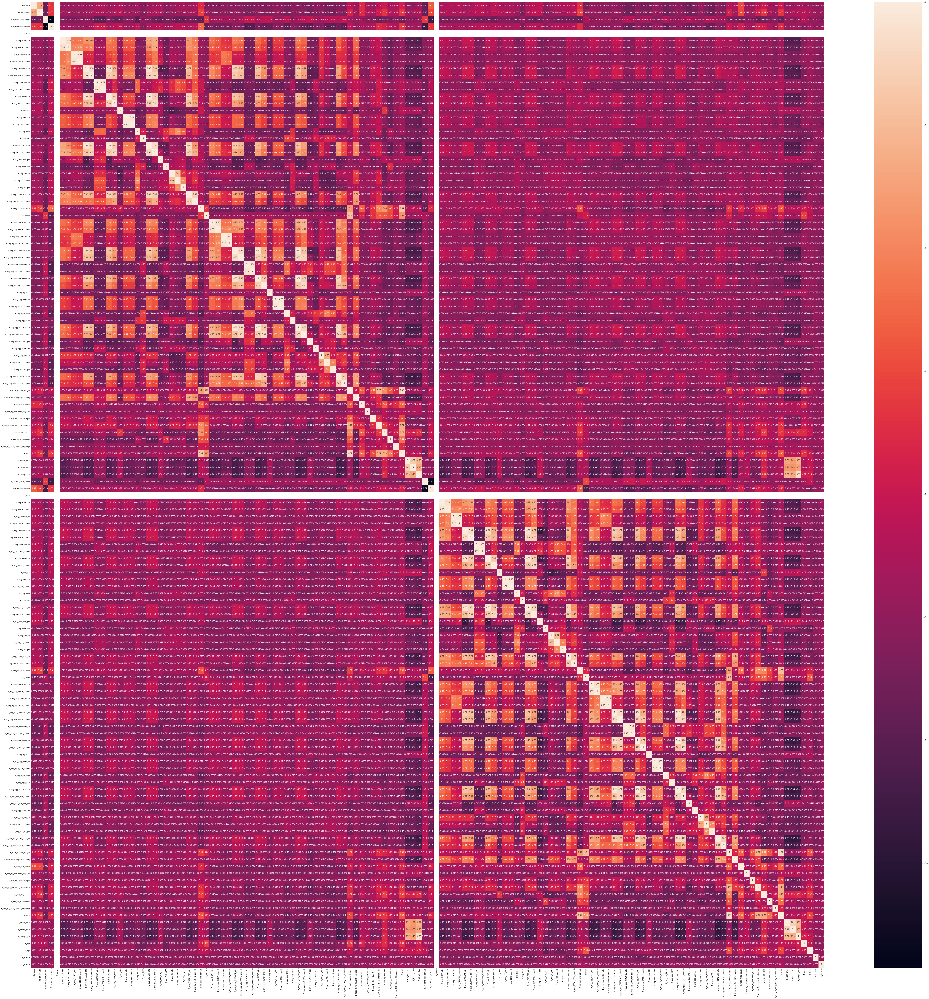

In [48]:
fig, ax = plt.subplots(figsize=(100,100))
corr_heatmap = sns.heatmap(df_cor, xticklabels=df_cor.columns, yticklabels=df_cor.columns, annot=True, ax=ax)
figure1 = corr_heatmap.get_figure()
figure1.savefig('ufc_heatmap.png')


In [49]:
df_cowboy_cor = df_cowboy.corr()

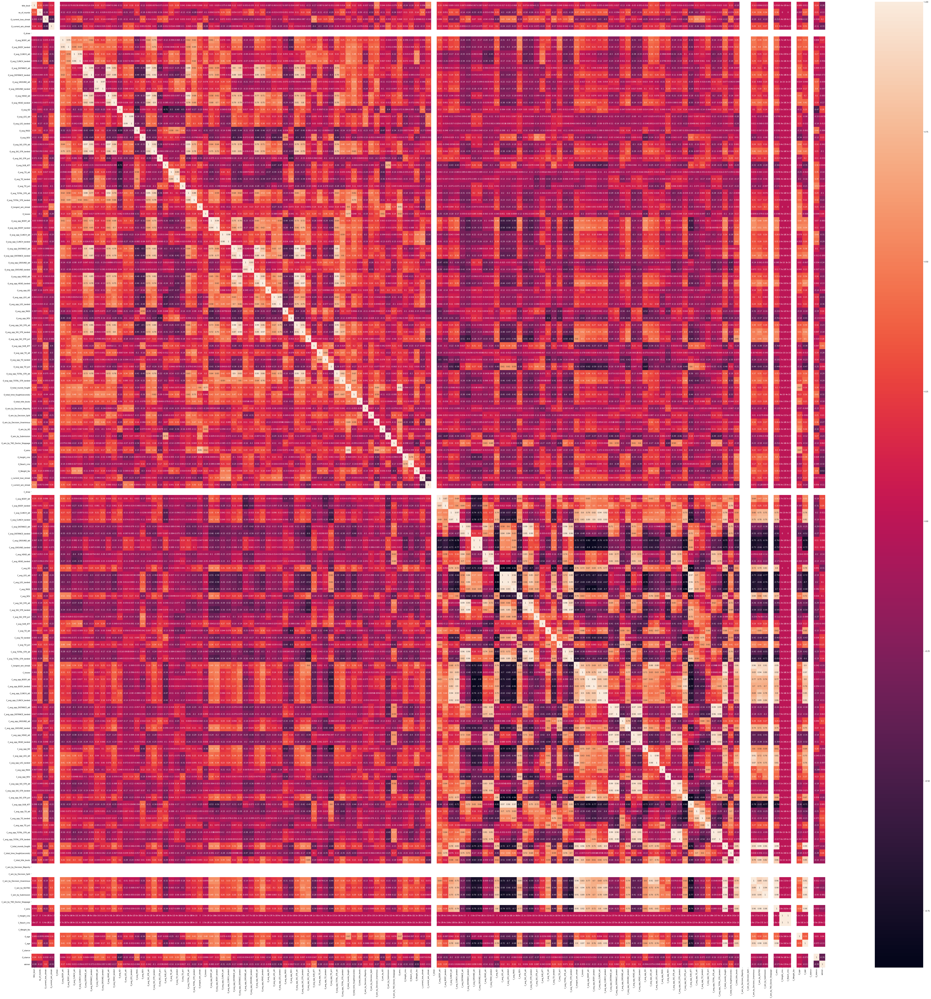

In [50]:
fig, ax = plt.subplots(figsize=(100,100))
corr_heatmap = sns.heatmap(df_cowboy_cor, xticklabels=df_cowboy_cor.columns, yticklabels=df_cowboy_cor.columns, annot=True, ax=ax)
figure1 = corr_heatmap.get_figure()
figure1.savefig('cowboy_heatmap.png')


In [52]:
df_cowboy.describe()

,no_of_rounds,O_current_lose_streak,O_current_win_streak,O_draw,O_avg_BODY_att,O_avg_BODY_landed,O_avg_CLINCH_att,O_avg_CLINCH_landed,O_avg_DISTANCE_att,O_avg_DISTANCE_landed,O_avg_GROUND_att,O_avg_GROUND_landed,O_avg_HEAD_att,O_avg_HEAD_landed,O_avg_KD,O_avg_LEG_att,O_avg_LEG_landed,O_avg_PASS,O_avg_REV,O_avg_SIG_STR_att,O_avg_SIG_STR_landed,O_avg_SIG_STR_pct,O_avg_SUB_ATT,O_avg_TD_att,O_avg_TD_landed,O_avg_TD_pct,O_avg_TOTAL_STR_att,O_avg_TOTAL_STR_landed,O_longest_win_streak,O_losses,O_avg_opp_BODY_att,O_avg_opp_BODY_landed,O_avg_opp_CLINCH_att,O_avg_opp_CLINCH_landed,O_avg_opp_DISTANCE_att,O_avg_opp_DISTANCE_landed,O_avg_opp_GROUND_att,O_avg_opp_GROUND_landed,O_avg_opp_HEAD_att,O_avg_opp_HEAD_landed,O_avg_opp_KD,O_avg_opp_LEG_att,O_avg_opp_LEG_landed,O_avg_opp_PASS,O_avg_opp_REV,O_avg_opp_SIG_STR_att,O_avg_opp_SIG_STR_landed,O_avg_opp_SIG_STR_pct,O_avg_opp_SUB_ATT,O_avg_opp_TD_att,O_avg_opp_TD_landed,O_avg_opp_TD_pct,O_avg_opp_TOTAL_STR_att,O_avg_opp_TOTAL_STR_landed,O_total_rounds_fought,O_total_time_fought(seconds),O_total_title_bouts,O_win_by_Decision_Majority,O_win_by_Decision_Split,O_win_by_Decision_Unanimous,O_win_by_KO,O_win_by_Submission,O_win_by_TKO_Doctor_Stoppage,O_wins,O_Height_cms,O_Reach_cms,O_Weight_lbs,c_current_lose_streak,C_current_win_streak,C_draw,C_avg_BODY_att,C_avg_BODY_landed,C_avg_CLINCH_att,C_avg_CLINCH_landed,C_avg_DISTANCE_att,C_avg_DISTANCE_landed,C_avg_GROUND_att,C_avg_GROUND_landed,C_avg_HEAD_att,C_avg_HEAD_landed,C_avg_KD,C_avg_LEG_att,C_avg_LEG_landed,C_avg_PASS,C_avg_REV,C_avg_SIG_STR_att,C_avg_SIG_STR_landed,C_avg_SIG_STR_pct,C_avg_SUB_ATT,C_avg_TD_att,C_avg_TD_landed,C_avg_TD_pct,C_avg_TOTAL_STR_att,C_avg_TOTAL_STR_landed,C_longest_win_streak,C_losses,C_avg_opp_BODY_att,C_avg_opp_BODY_landed,C_avg_opp_CLINCH_att,C_avg_opp_CLINCH_landed,C_avg_opp_DISTANCE_att,C_avg_opp_DISTANCE_landed,C_avg_opp_GROUND_att,C_avg_opp_GROUND_landed,C_avg_opp_HEAD_att,C_avg_opp_HEAD_landed,C_avg_opp_KD,C_avg_opp_LEG_att,C_avg_opp_LEG_landed,C_avg_opp_PASS,C_avg_opp_REV,C_avg_opp_SIG_STR_att,C_avg_opp_SIG_STR_landed,C_avg_opp_SIG_STR_pct,C_avg_opp_SUB_ATT,C_avg_opp_TD_att,C_avg_opp_TD_landed,C_avg_opp_TD_pct,C_avg_opp_TOTAL_STR_att,C_avg_opp_TOTAL_STR_landed,C_total_rounds_fought,C_total_time_fought(seconds),C_total_title_bouts,C_win_by_Decision_Majority,C_win_by_Decision_Split,C_win_by_Decision_Unanimous,C_win_by_KO/TKO,C_win_by_Submission,C_win_by_TKO_Doctor_Stoppage,C_wins,C_Height_cms,C_Reach_cms,C_Weight_lbs,O_age,C_age,C_stance,O_stance,winner
count,28.000000,28.000000,28.000000,28.0,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.0,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.0,28.0,28.000000,28.000000,28.000000,28.0,28.000000,2.800000e+01,2.800000e+01,28.0,28.000000,28.000000,28.0,28.000000,28.000000
mean,3.500000,0.285714,2.321429,0.0,10.534348,6.908904,7.779290,5.065692,68.419516,25.324168,8.375030,5.417841,66.471856,22.919789,0

In [51]:
df_cowboy.to_csv('Cowboy_fights')

In [53]:
df.to_csv('Cleaned_fights')